In [3]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

In [4]:
dataset=pd.read_csv("water_potability.csv")

In [5]:
dataset.head()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,NaN,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0
1,3.716080,129.422921,18630.057858,6.635246,NaN,592.885359,15.180013,56.329076,4.500656,0
2,8.099124,224.236259,19909.541732,9.275884,NaN,418.606213,16.868637,66.420093,3.055934,0
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0


In [6]:
print(dataset.shape)

(3276, 10)


In [7]:
print(dataset.columns)

Index(['ph', 'Hardness', 'Solids', 'Chloramines', 'Sulfate', 'Conductivity',
       'Organic_carbon', 'Trihalomethanes', 'Turbidity', 'Potability'],
      dtype='object')


In [8]:
dataset.describe()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
count,2785.000000,3276.000000,3276.000000,3276.000000,2495.000000,3276.000000,3276.000000,3114.000000,3276.000000,3276.000000
mean,7.080795,196.369496,22014.092526,7.122277,333.775777,426.205111,14.284970,66.396293,3.966786,0.390110
std,1.594320,32.879761,8768.570828,1.583085,41.416840,80.824064,3.308162,16.175008,0.780382,0.487849
min,0.000000,47.432000,320.942611,0.352000,129.000000,181.483754,2.200000,0.738000,1.450000,0.000000
25%,6.093092,176.850538,15666.690297,6.127421,307.699498,365.734414,12.065801,55.844536,3.439711,0.000000
50%,7.036752,196.967627,20927.833607,7.130299,333.073546,421.884968,14.218338,66.622485,3.955028,0.000000
75%,8.062066,216.667456,27332.762127,8.114887,359.950170,481.792304,16.557652,77.337473,4.500320,1.000000
max,14.000000,323.124000,61227.196008,13.127000,481.030642,753.342620,28.300000,124.000000,6.739000,1.000000


In [9]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3276 entries, 0 to 3275
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ph               2785 non-null   float64
 1   Hardness         3276 non-null   float64
 2   Solids           3276 non-null   float64
 3   Chloramines      3276 non-null   float64
 4   Sulfate          2495 non-null   float64
 5   Conductivity     3276 non-null   float64
 6   Organic_carbon   3276 non-null   float64
 7   Trihalomethanes  3114 non-null   float64
 8   Turbidity        3276 non-null   float64
 9   Potability       3276 non-null   int64  
dtypes: float64(9), int64(1)
memory usage: 256.1 KB


In [10]:
print(dataset.nunique())

ph                 2785
Hardness           3276
Solids             3276
Chloramines        3276
Sulfate            2495
Conductivity       3276
Organic_carbon     3276
Trihalomethanes    3114
Turbidity          3276
Potability            2
dtype: int64


In [11]:
print(dataset.isnull().sum())

ph                 491
Hardness             0
Solids               0
Chloramines          0
Sulfate            781
Conductivity         0
Organic_carbon       0
Trihalomethanes    162
Turbidity            0
Potability           0
dtype: int64


<Axes: >

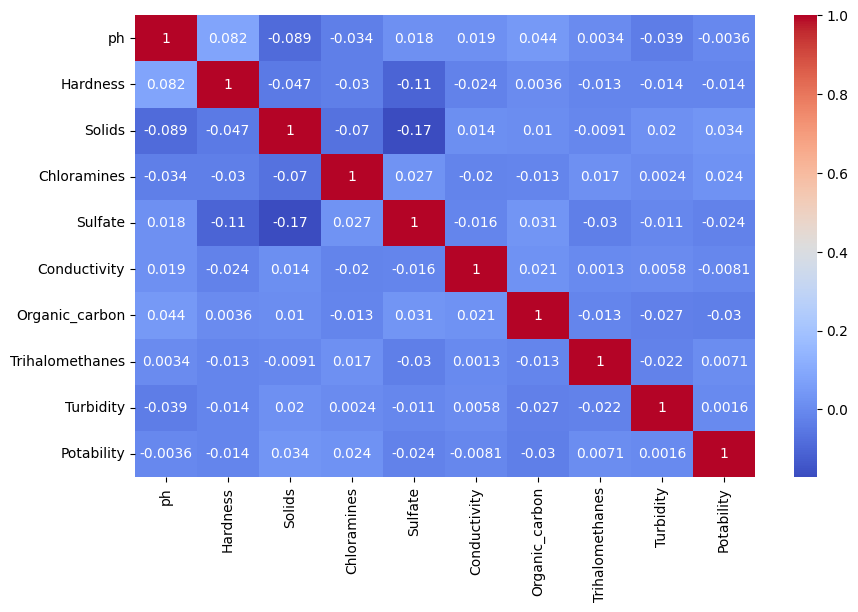

In [13]:
#annot=True means that the values of the correlations will be annotated (displayed) inside the heatmap cells. 
#Each cell will display its correlation coefficient.
#cmap is the colormap parameter, which defines the color gradient used in the heatmap. 
#Here, 'coolwarm' is used, which is a color gradient that moves from cool colors (like blue) for negative correlations to warm colors (like red) for positive correlations.
    #Blue colors indicate negative correlations.
    #Red colors indicate positive correlations.
    #White represents correlations close to zero (no correlation).


plt.figure(figsize=(10, 6))  #set the figure size
sns.heatmap(dataset.corr(), annot= True, cmap='coolwarm') #plot the heatmap

In [14]:
# Unstacking the correlation matrix to see the values more clearly.

corr = dataset.corr()
c1 = corr.abs().unstack()
c1.sort_values(ascending = False)[11:22:2]

Solids       Sulfate     0.171804
Sulfate      Hardness    0.106923
Solids       ph          0.089288
ph           Hardness    0.082096
Chloramines  Solids      0.070148
Solids       Hardness    0.046899
dtype: float64

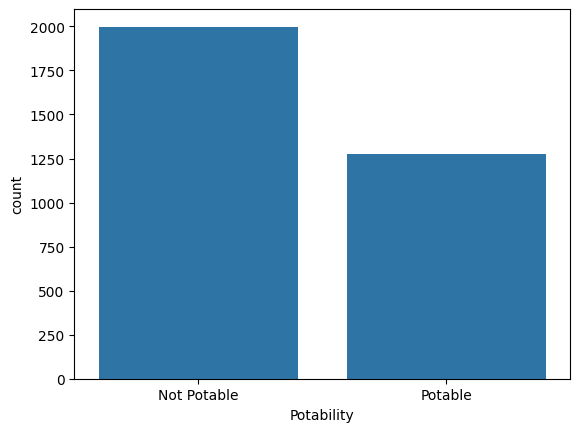

In [15]:
#sns.countplot: create a bar plot that shows the count of observations in each categorical bin using bars. 
#"Potability", which likely indicates whether water is potable (safe for drinking) or not potable.
#The bars' color saturation is controlled by saturation=0.8, making the colors less intense but still distinct.
ax = sns.countplot(x = "Potability",data= dataset, saturation=0.8)
plt.xticks(ticks=[0, 1], labels = ["Not Potable", "Potable"])
plt.show()

In [16]:
x = dataset.Potability.value_counts()
labels = [0,1]
print(x)

Potability
0    1998
1    1278
Name: count, dtype: int64


<Axes: xlabel='Potability', ylabel='ph'>

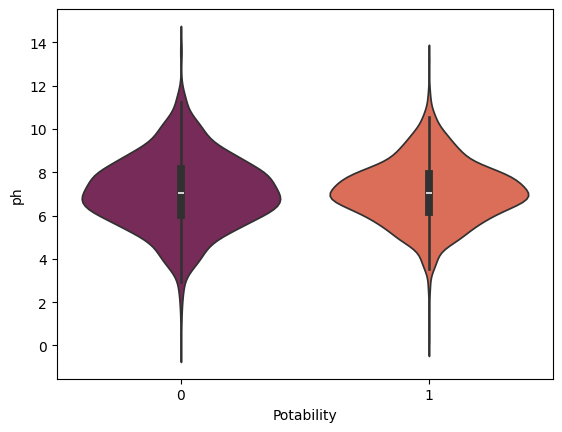

In [17]:
#The 'rocket' palette is one of Seaborn's built-in color palettes and provides a visually appealing gradient.
#a method of visualizing the distribution of data across different categories.
sns.violinplot(x='Potability', y='ph', data=dataset, palette='rocket')

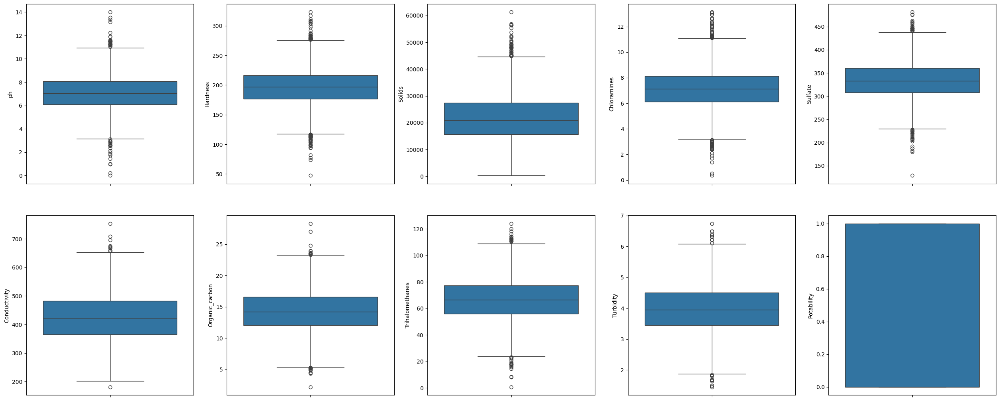

In [18]:
# Visualizing dataset and also checking for outliers 

fig, ax = plt.subplots(ncols = 5, nrows = 2, figsize = (25, 10))
index = 0
ax = ax.flatten()

for col, value in dataset.items():
    sns.boxplot(y=col, data=dataset, ax=ax[index])
    index += 1
plt.tight_layout(pad = 0.5, w_pad=0.7, h_pad=5.0)

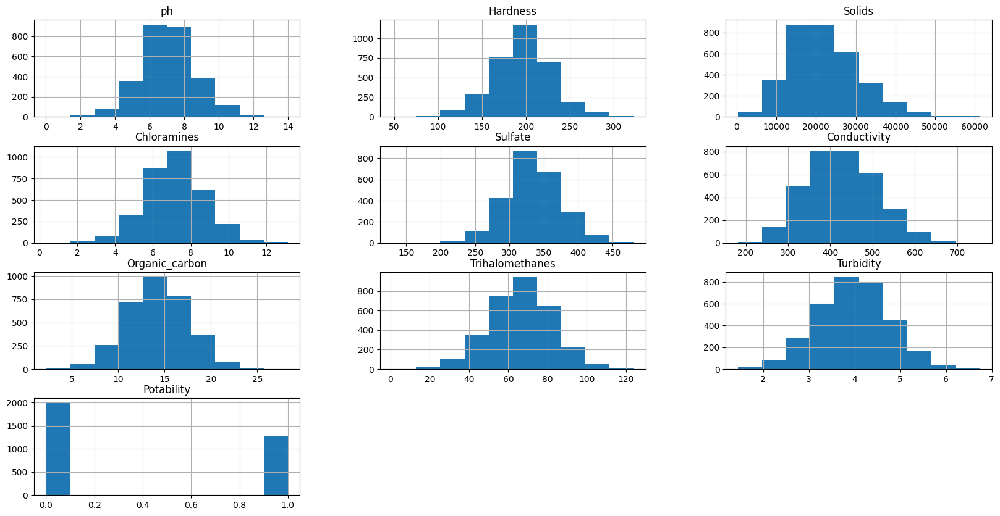

In [19]:
plt.rcParams['figure.figsize'] = [20,10]
dataset.hist()
plt.show()

<Axes: xlabel='Potability', ylabel='Density'>

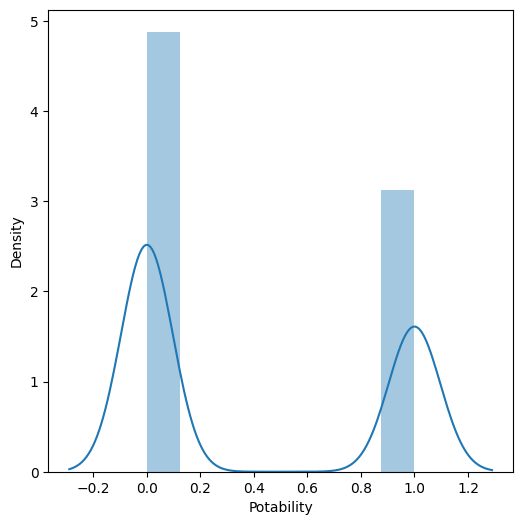

In [20]:
plt.rcParams['figure.figsize'] = [6,6]
sns.distplot(dataset['Potability'])

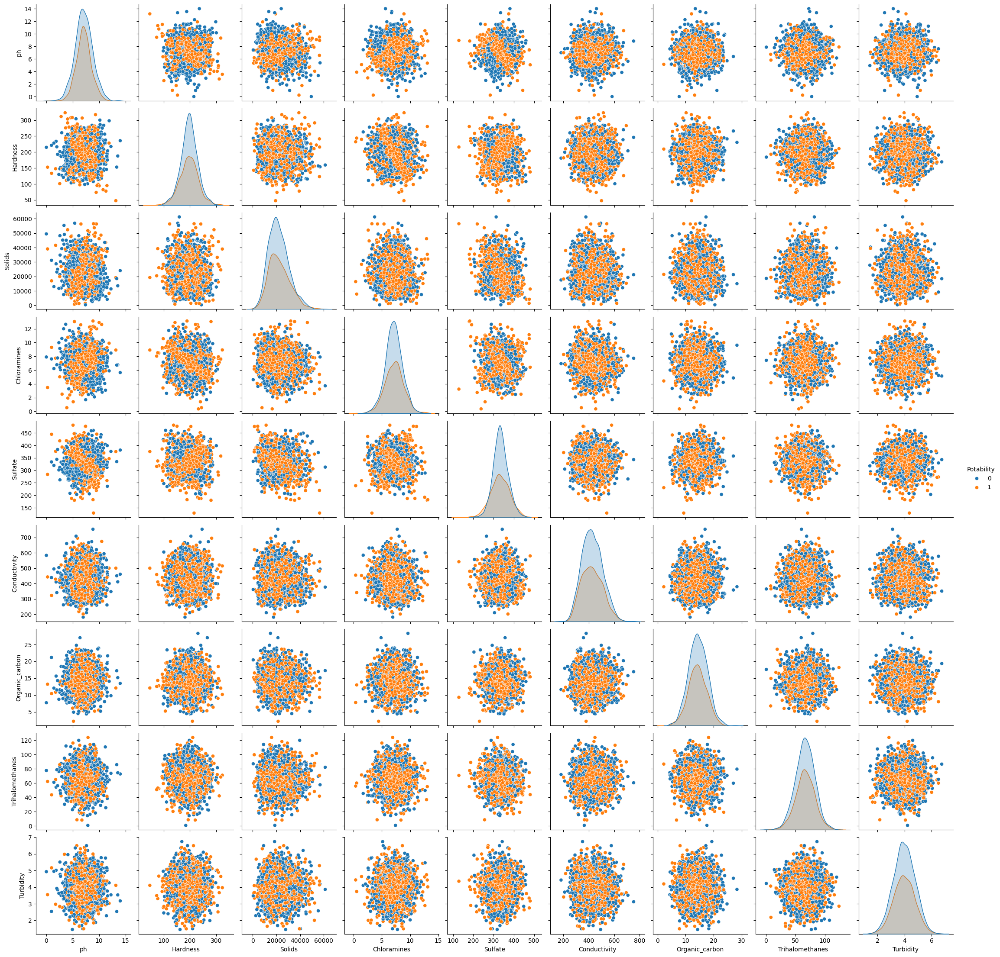

In [21]:
sns.pairplot(dataset, hue="Potability")

array([<Axes: title={'center': '0'}>, <Axes: title={'center': '1'}>],
      dtype=object)

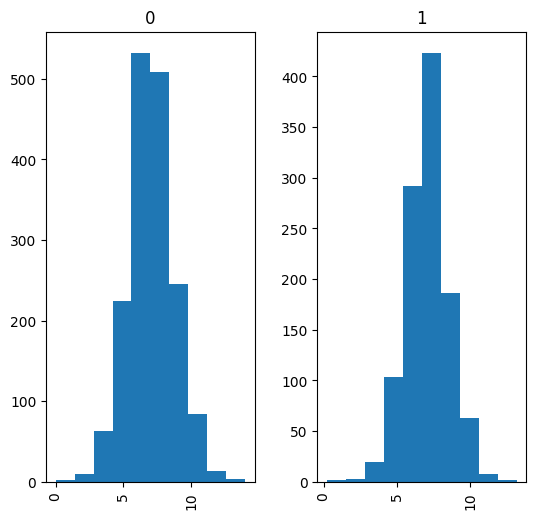

In [22]:
dataset.hist(column='ph', by='Potability')


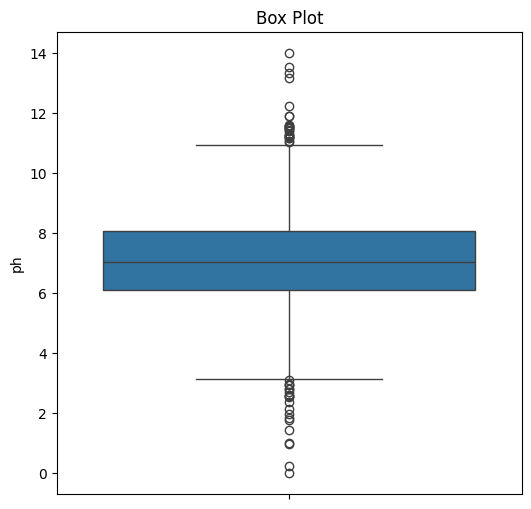

In [23]:
def Box(dataset):
    plt.title("Box Plot")
    sns.boxplot(dataset)
    plt.show()
Box(dataset['ph'])

<Axes: xlabel='Hardness', ylabel='Count'>

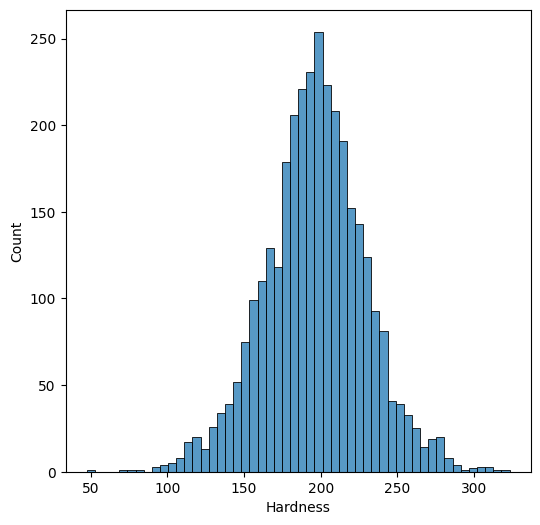

In [24]:
sns.histplot(x = "Hardness", data=dataset)

In [25]:
dataset.nunique()

ph                 2785
Hardness           3276
Solids             3276
Chloramines        3276
Sulfate            2495
Conductivity       3276
Organic_carbon     3276
Trihalomethanes    3114
Turbidity          3276
Potability            2
dtype: int64

In [26]:
skew_val = dataset.skew().sort_values(ascending=False)
skew_val

Solids             0.621634
Potability         0.450784
Conductivity       0.264490
ph                 0.025630
Organic_carbon     0.025533
Turbidity         -0.007817
Chloramines       -0.012098
Sulfate           -0.035947
Hardness          -0.039342
Trihalomethanes   -0.083031
dtype: float64

In [27]:
fig = px.box(dataset, x="Potability", y="ph", color="Potability", width=800, height=400)
fig.show()


In [28]:
fig =  px.pie (dataset, names = "Potability", hole = 0.4, template = "plotly_dark")
fig.show ()

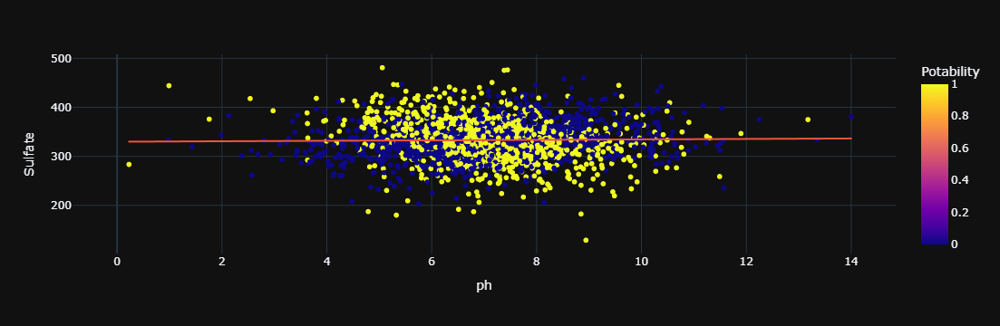

In [29]:
fig = px.scatter (dataset, x = "ph", y = "Sulfate", color = "Potability", template = "plotly_dark",  trendline="ols")
fig.show ()

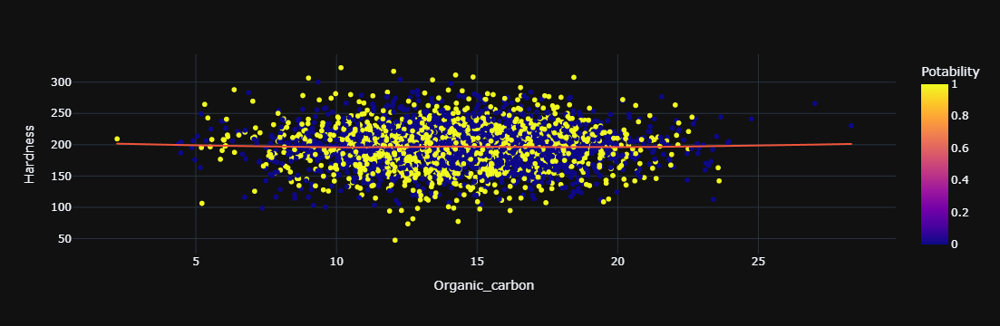

In [30]:
fig = px.scatter (dataset, x = "Organic_carbon", y = "Hardness", color = "Potability", template = "plotly_dark",  trendline="lowess")
fig.show ()

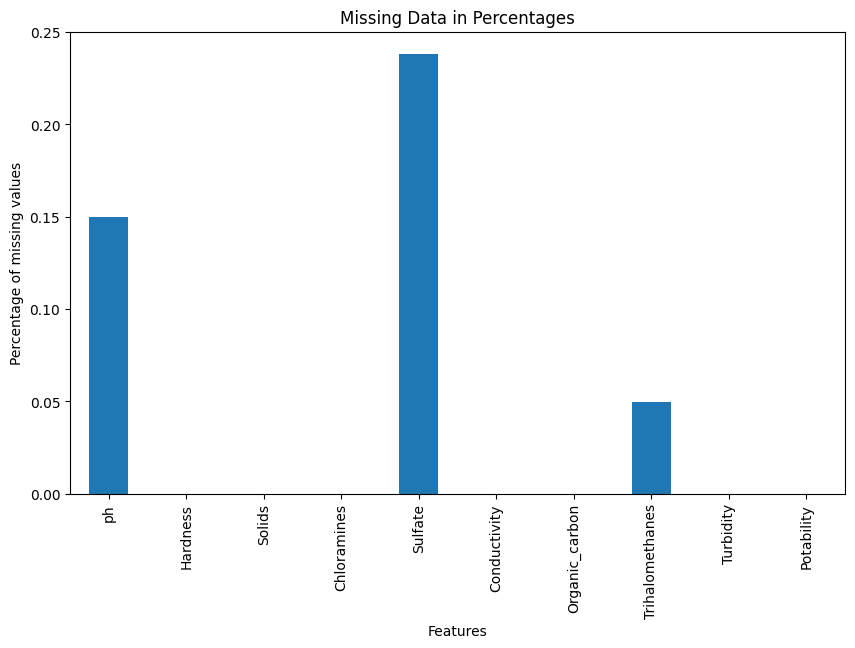

In [31]:
dataset.isnull().mean().plot.bar(figsize=(10,6)) 
plt.ylabel('Percentage of missing values') 
plt.xlabel('Features') 
plt.title('Missing Data in Percentages');

In [34]:
dataset['ph'] = dataset['ph'].fillna(dataset['ph'].mean())
dataset['Sulfate'] = dataset['Sulfate'].fillna(dataset['Sulfate'].mean())
dataset['Trihalomethanes'] = dataset['Trihalomethanes'].fillna(dataset['Trihalomethanes'].mean())

In [35]:
dataset.head()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,7.080795,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0
1,3.716080,129.422921,18630.057858,6.635246,333.775777,592.885359,15.180013,56.329076,4.500656,0
2,8.099124,224.236259,19909.541732,9.275884,333.775777,418.606213,16.868637,66.420093,3.055934,0
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0


<Axes: >

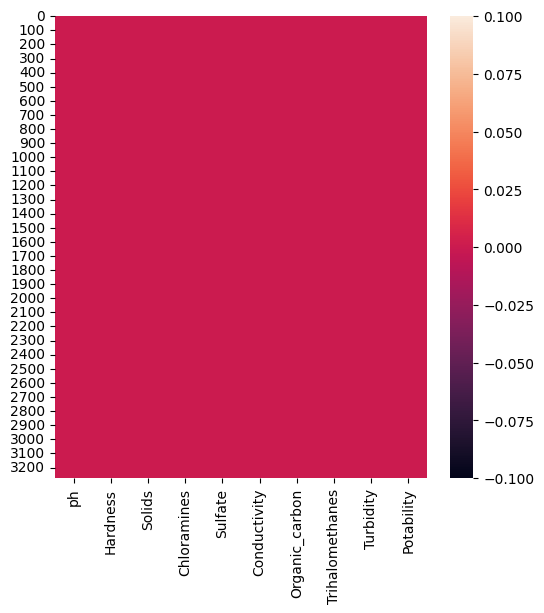

In [36]:
sns.heatmap(dataset.isnull())

In [37]:
dataset.isnull().sum()

ph                 0
Hardness           0
Solids             0
Chloramines        0
Sulfate            0
Conductivity       0
Organic_carbon     0
Trihalomethanes    0
Turbidity          0
Potability         0
dtype: int64

In [38]:
X = dataset.drop('Potability', axis=1)
y = dataset['Potability']

In [39]:
X.shape, y.shape

((3276, 9), (3276,))

In [40]:
# import StandardScaler to perform scaling
#sklearn is a powerful library and it provides efficient tools for data mining, data analysis,
#and building machine learning models.
from sklearn.preprocessing import StandardScaler 
scaler = StandardScaler()

In [41]:
X = scaler.fit_transform(X)
X

array([[-6.04313345e-16,  2.59194711e-01, -1.39470871e-01, ...,
        -1.18065057e+00,  1.30614943e+00, -1.28629758e+00],
       [-2.28933938e+00, -2.03641367e+00, -3.85986650e-01, ...,
         2.70597240e-01, -6.38479983e-01,  6.84217891e-01],
       [ 6.92867789e-01,  8.47664833e-01, -2.40047337e-01, ...,
         7.81116857e-01,  1.50940884e-03, -1.16736546e+00],
       ...,
       [ 1.59125368e+00, -6.26829230e-01,  1.27080989e+00, ...,
        -9.81329234e-01,  2.18748247e-01, -8.56006782e-01],
       [-1.32951593e+00,  1.04135450e+00, -1.14405809e+00, ...,
        -9.42063817e-01,  7.03468419e-01,  9.50797383e-01],
       [ 5.40150905e-01, -3.85462310e-02, -5.25811937e-01, ...,
         5.60940070e-01,  7.80223466e-01, -2.12445866e+00]])

In [42]:
# import train-test split 
from sklearn.model_selection import train_test_split

In [43]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

In [44]:
#Using Logistic Regression
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report

In [45]:
# Creating model object
model_lg = LogisticRegression(max_iter=120,random_state=0, n_jobs=20)


In [46]:
# Training Model
model_lg.fit(X_train, y_train)
print(model_lg)

LogisticRegression(max_iter=120, n_jobs=20, random_state=0)


In [47]:
# Making Prediction
pred_lg = model_lg.predict(X_test)
print(pred_lg)

[0 0 0 ... 0 0 0]


In [48]:
# Calculating Accuracy Score
#3: Accuracy is the ratio of correctly predicted observations to the total observations. It is a basic metric for classification problems but may not be the best metric for imbalanced datasets.
lg = accuracy_score(y_test, pred_lg)
print(lg)

0.6284658040665434


In [49]:
#Classification Report: The classification report provides detailed metrics such as precision, recall, and F1-score for each class.

#Precision: The number of true positives divided by the number of predicted positives.
#Recall: The number of true positives divided by the number of actual positives.
#F1-score: The harmonic mean of precision and recall.

print(classification_report(y_test,pred_lg))

              precision    recall  f1-score   support

           0       0.63      1.00      0.77       680
           1       0.00      0.00      0.00       402

    accuracy                           0.63      1082
   macro avg       0.31      0.50      0.39      1082
weighted avg       0.39      0.63      0.49      1082



<Axes: >

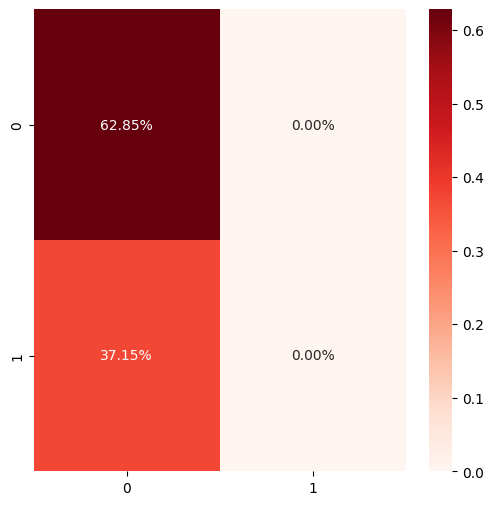

In [50]:
# confusion Maxtrix
# The confusion matrix is a table that summarizes the performance of a classification algorithm. 
#It compares the actual target values with the predicted values. It shows:

#True Positives (TP): Correctly classified positive cases
#True Negatives (TN): Correctly classified negative cases
#False Positives (FP): Incorrectly classified negative cases as positive (Type I error)
#False Negatives (FN): Incorrectly classified positive cases as negative (Type II error)

cm1 = confusion_matrix(y_test, pred_lg)
sns.heatmap(cm1/np.sum(cm1), annot = True, fmt=  '0.2%', cmap = 'Reds')

In [51]:
#Using Decision Tree Classifier

In [52]:
from sklearn.tree import DecisionTreeClassifier

In [53]:
model_dt = DecisionTreeClassifier( max_depth=4, random_state=42)


In [54]:
# Training Model
model_dt.fit(X_train,y_train)

DecisionTreeClassifier(max_depth=4, random_state=42)

In [55]:
# Making Prediction
pred_dt = model_dt.predict(X_test)

In [56]:
# Calculating Accuracy Score
dt = accuracy_score(y_test, pred_dt)
print(dt)

0.6451016635859519


In [57]:
print(classification_report(y_test,pred_dt))

              precision    recall  f1-score   support

           0       0.66      0.90      0.76       680
           1       0.56      0.22      0.32       402

    accuracy                           0.65      1082
   macro avg       0.61      0.56      0.54      1082
weighted avg       0.62      0.65      0.60      1082



<Axes: >

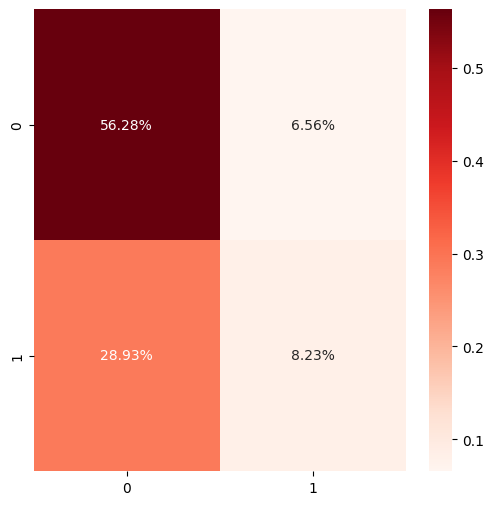

In [58]:
# confusion Maxtrix
cm2 = confusion_matrix(y_test, pred_dt)
sns.heatmap(cm2/np.sum(cm2), annot = True, fmt=  '0.2%', cmap = 'Reds')

In [59]:
#Using Random Forest
from sklearn.ensemble import RandomForestClassifier

In [60]:
# Creating model object
model_rf = RandomForestClassifier(n_estimators=300,min_samples_leaf=0.16, random_state=42)

In [61]:
# Training Model
model_rf.fit(X_train, y_train)

RandomForestClassifier(min_samples_leaf=0.16, n_estimators=300, random_state=42)

In [62]:
# Making Prediction
pred_rf = model_rf.predict(X_test)


In [63]:
# Calculating Accuracy Score
rf = accuracy_score(y_test, pred_rf)
print(rf)

0.6284658040665434


In [64]:
print(classification_report(y_test,pred_rf))


              precision    recall  f1-score   support

           0       0.63      1.00      0.77       680
           1       0.00      0.00      0.00       402

    accuracy                           0.63      1082
   macro avg       0.31      0.50      0.39      1082
weighted avg       0.39      0.63      0.49      1082



<Axes: >

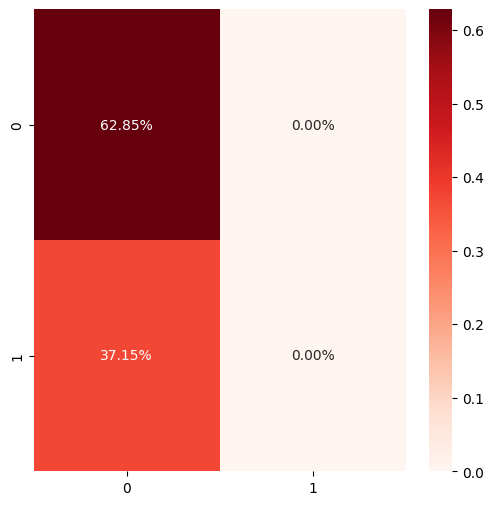

In [65]:
# confusion Maxtrix
cm3 = confusion_matrix(y_test, pred_rf)
sns.heatmap(cm3/np.sum(cm3), annot = True, fmt=  '0.2%', cmap = 'Reds')

In [88]:
#sklearn.tree module is a powerful tool for classification tasks. 
#It builds a decision tree based on the features of your data, making decisions based on the values of those features.
#import Libraries
#load your data
#split the data
#create the Model
#train the model 
#make predictions
#Evaluate the Model
#Hperparameter tuning
#Feature Importance
from sklearn.tree import DecisionTreeClassifier

In [89]:
# Creating model object
model_dt = DecisionTreeClassifier( max_depth=4, random_state=44)

In [90]:
# Training Model
model_dt.fit(X_train,y_train)

DecisionTreeClassifier(max_depth=4, random_state=44)

In [91]:
# Making Prediction
pred_dt = model_dt.predict(X_test)

In [92]:
# Calculating Accuracy Score
dt = accuracy_score(y_test, pred_dt)
print(dt)

0.6451016635859519


In [93]:
print(classification_report(y_test,pred_dt))

              precision    recall  f1-score   support

           0       0.66      0.90      0.76       680
           1       0.56      0.22      0.31       402

    accuracy                           0.65      1082
   macro avg       0.61      0.56      0.54      1082
weighted avg       0.62      0.65      0.59      1082



<Axes: >

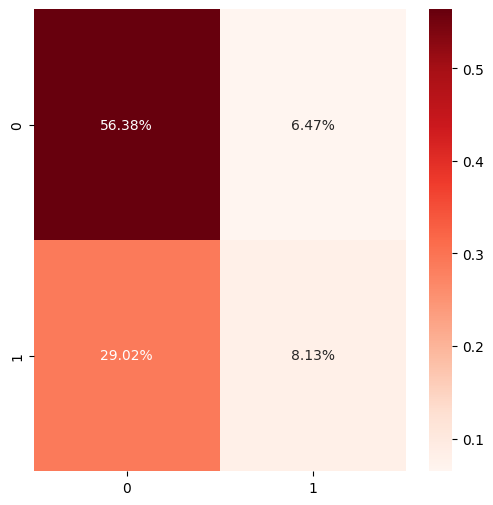

In [94]:
# confusion Maxtrix
cm2 = confusion_matrix(y_test, pred_dt)
sns.heatmap(cm2/np.sum(cm2), annot = True, fmt=  '0.2%', cmap = 'Reds')

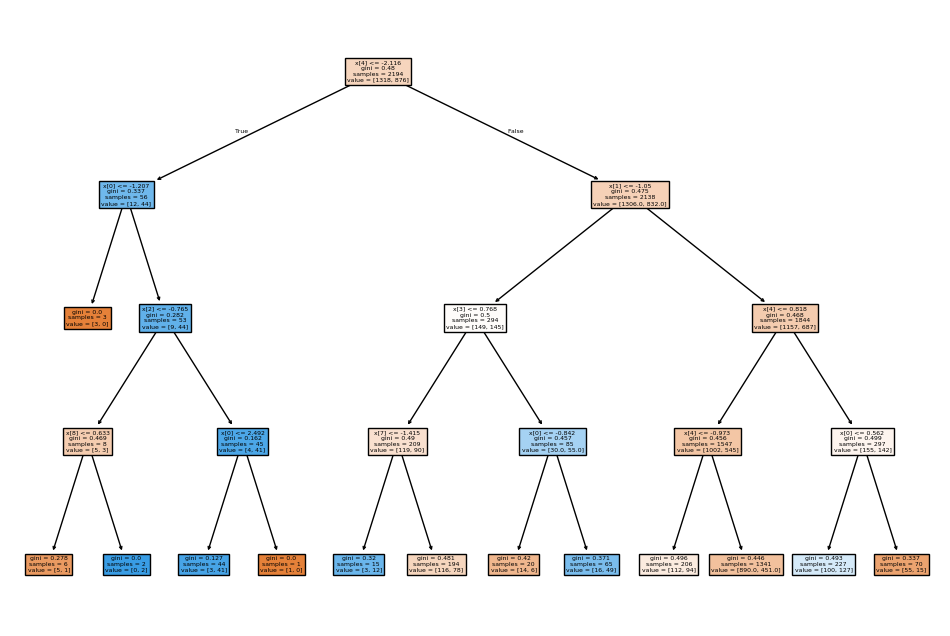

In [95]:
from sklearn.tree import plot_tree

plt.figure(figsize=(12, 8))
plot_tree(model_dt, filled=True)
plt.show()

In [96]:
feature_importances = model_dt.feature_importances_
print(feature_importances)

[0.31498145 0.09426563 0.04986818 0.07230485 0.38565133 0.
 0.         0.05632032 0.02660823]


In [98]:
#The RandomForestClassifier from the sklearn.ensemble module is an ensemble learning method that combines multiple decision trees to improve classification accuracy and control overfitting
from sklearn.ensemble import RandomForestClassifier

In [99]:
# Creating model object
model_rf = RandomForestClassifier(n_estimators=300,min_samples_leaf=0.16, random_state=42)

In [100]:
# Training Model
model_rf.fit(X_train, y_train)

RandomForestClassifier(min_samples_leaf=0.16, n_estimators=300, random_state=42)

In [101]:
# Making Prediction
pred_rf = model_rf.predict(X_test)

In [102]:
# Calculating Accuracy Score
rf = accuracy_score(y_test, pred_rf)
print(rf)

0.6284658040665434


In [103]:
print(classification_report(y_test,pred_rf))

              precision    recall  f1-score   support

           0       0.63      1.00      0.77       680
           1       0.00      0.00      0.00       402

    accuracy                           0.63      1082
   macro avg       0.31      0.50      0.39      1082
weighted avg       0.39      0.63      0.49      1082



<Axes: >

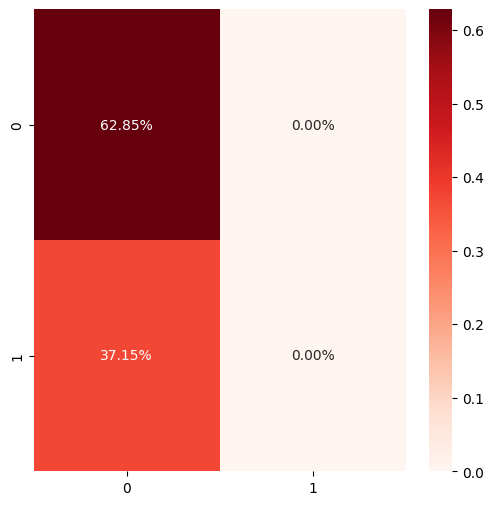

In [104]:
# confusion Maxtrix
cm3 = confusion_matrix(y_test, pred_rf)
sns.heatmap(cm3/np.sum(cm3), annot = True, fmt=  '0.2%', cmap = 'Reds')

In [105]:
from sklearn.model_selection import cross_val_score

scores = cross_val_score(model_rf, X, y, cv=5)
print(f'Cross-Validation Scores: {scores}')

Cross-Validation Scores: [0.6097561  0.61068702 0.61068702 0.60916031 0.60916031]


In [106]:
#Using XGBoost Classifier

In [107]:
from xgboost import XGBClassifier

In [108]:
# Creating model object
model_xgb = XGBClassifier(max_depth= 8, n_estimators= 125, random_state= 0,  learning_rate= 0.03, n_jobs=5)

In [109]:
# Training Model
model_xgb.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.03, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=8, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=125, n_jobs=5,
              num_parallel_tree=None, random_state=0, ...)

In [110]:
# Making Prediction
pred_xgb = model_xgb.predict(X_test)

In [111]:
# Calculating Accuracy Score
xgb = accuracy_score(y_test, pred_xgb)
print(xgb)

0.6654343807763401


In [112]:
print(classification_report(y_test,pred_xgb))

              precision    recall  f1-score   support

           0       0.68      0.89      0.77       680
           1       0.60      0.29      0.39       402

    accuracy                           0.67      1082
   macro avg       0.64      0.59      0.58      1082
weighted avg       0.65      0.67      0.63      1082



<Axes: >

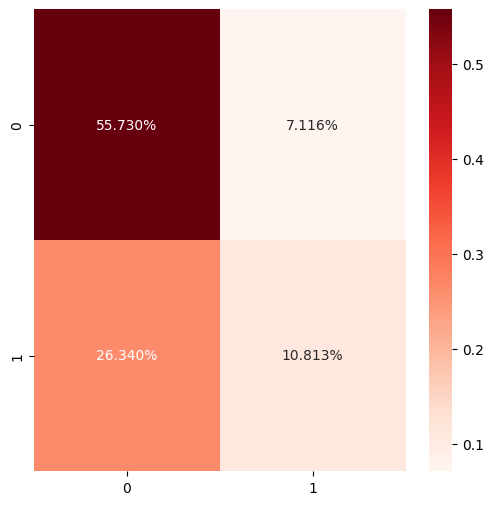

In [113]:
# confusion Maxtrix
cm4 = confusion_matrix(y_test, pred_xgb)
sns.heatmap(cm4/np.sum(cm4), annot = True, fmt=  '0.3%', cmap = 'Reds')

<Figure size 1000x800 with 0 Axes>

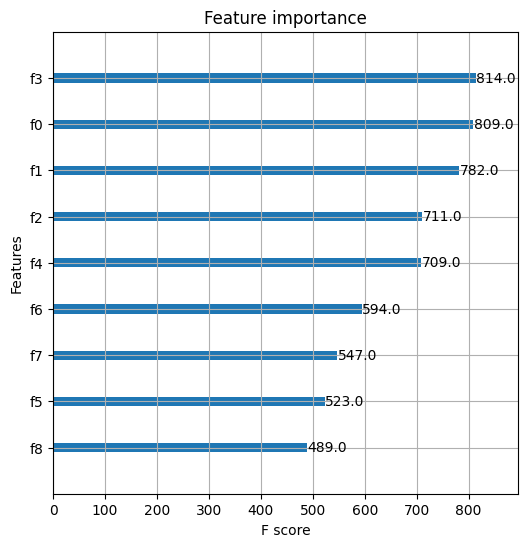

In [114]:
#hyperparameter tuning
from xgboost import plot_importance

plt.figure(figsize=(10, 8))
plot_importance(model_xgb)
plt.show()

In [115]:
#cross-validation
#from xgboost import cv

#cv_results = cv(dtrain=model_xgb, dtest=X, num_boost_round=100, nfold=5, metrics="mlogloss", seed=42)
#print(cv_results)

In [116]:
# algorithm used for both classification and regression tasks.
#It classifies data points based on the similarity (distance metric, typically Euclidean distance) between the points
from sklearn.neighbors import KNeighborsClassifier

In [117]:
# Creating model object
model_kn = KNeighborsClassifier(n_neighbors=9, leaf_size=20)

In [118]:
# Training Model
model_kn.fit(X_train, y_train)

KNeighborsClassifier(leaf_size=20, n_neighbors=9)

In [119]:
# Making Prediction
pred_kn = model_kn.predict(X_test)

In [120]:
# Calculating Accuracy Score
kn = accuracy_score(y_test, pred_kn)
print(kn)

0.6534195933456562


In [121]:
print(classification_report(y_test,pred_kn))

              precision    recall  f1-score   support

           0       0.69      0.82      0.75       680
           1       0.55      0.37      0.44       402

    accuracy                           0.65      1082
   macro avg       0.62      0.60      0.59      1082
weighted avg       0.64      0.65      0.63      1082



<Axes: >

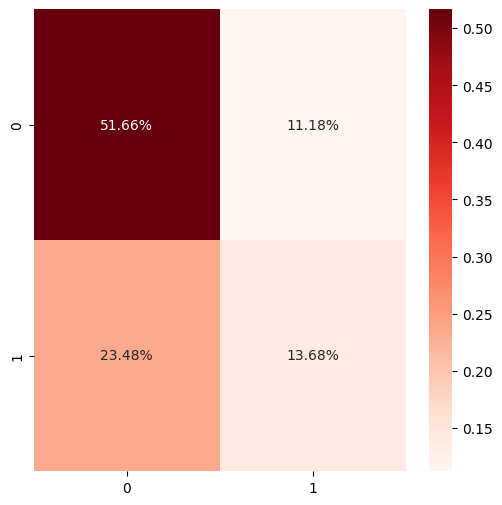

In [122]:
# confusion Maxtrix
cm5 = confusion_matrix(y_test, pred_kn)
sns.heatmap(cm5/np.sum(cm5), annot = True, fmt=  '0.2%', cmap = 'Reds')

In [123]:
from sklearn.svm import SVC, LinearSVC

In [124]:
model_svm = SVC(kernel='rbf', random_state = 42)

In [125]:
model_svm.fit(X_train, y_train)

SVC(random_state=42)

In [126]:
# Making Prediction
pred_svm = model_svm.predict(X_test)

In [127]:
# Calculating Accuracy Score
sv = accuracy_score(y_test, pred_svm)
print(sv)

0.6885397412199631


In [128]:
print(classification_report(y_test,pred_kn))

              precision    recall  f1-score   support

           0       0.69      0.82      0.75       680
           1       0.55      0.37      0.44       402

    accuracy                           0.65      1082
   macro avg       0.62      0.60      0.59      1082
weighted avg       0.64      0.65      0.63      1082



<Axes: >

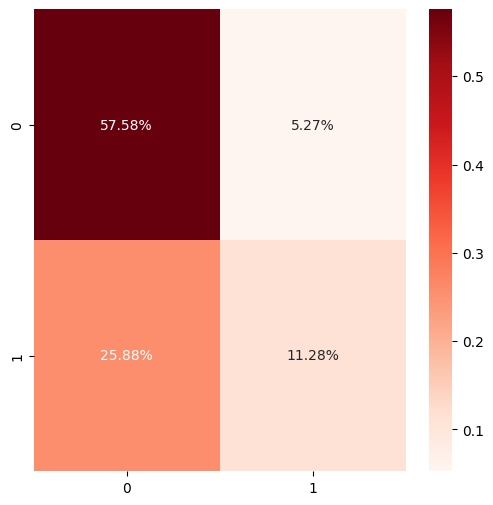

In [129]:
# confusion Maxtrix
cm6 = confusion_matrix(y_test, pred_svm)
sns.heatmap(cm6/np.sum(cm6), annot = True, fmt=  '0.2%', cmap = 'Reds')

In [130]:
## Using AdaBoost Classifier

In [131]:
from sklearn.ensemble import AdaBoostClassifier

In [132]:
model_ada = AdaBoostClassifier(learning_rate= 0.002,n_estimators= 205,random_state=42)

In [133]:
model_ada.fit(X_train, y_train)

AdaBoostClassifier(learning_rate=0.002, n_estimators=205, random_state=42)

In [134]:
# Making Prediction
pred_ada = model_ada.predict(X_test)

In [135]:
# Calculating Accuracy Score
ada = accuracy_score(y_test, pred_ada)
print(ada)

0.634011090573013


In [136]:
print(classification_report(y_test,pred_ada))

              precision    recall  f1-score   support

           0       0.63      0.99      0.77       680
           1       0.62      0.04      0.07       402

    accuracy                           0.63      1082
   macro avg       0.62      0.51      0.42      1082
weighted avg       0.63      0.63      0.51      1082



<Axes: >

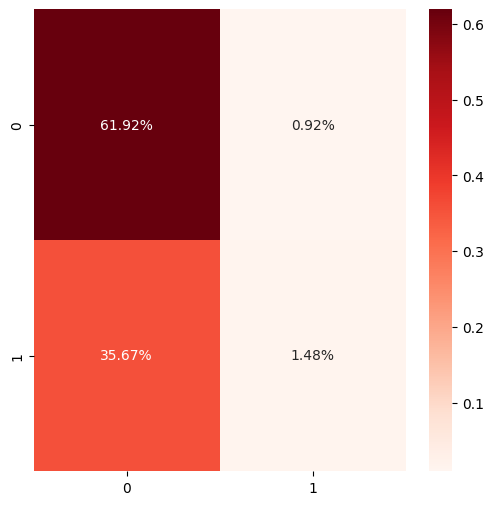

In [137]:
# confusion Maxtrix
cm7 = confusion_matrix(y_test, pred_ada)
sns.heatmap(cm7/np.sum(cm7), annot = True, fmt=  '0.2%', cmap = 'Reds')

,Model,Accuracy_score
5,SVM,0.688540
3,XGBoost,0.665434
4,KNeighbours,0.653420
1,Decision Tree,0.645102
6,AdaBoost,0.634011
2,Random Forest,0.628466
0,Logistic Regression,0.628466


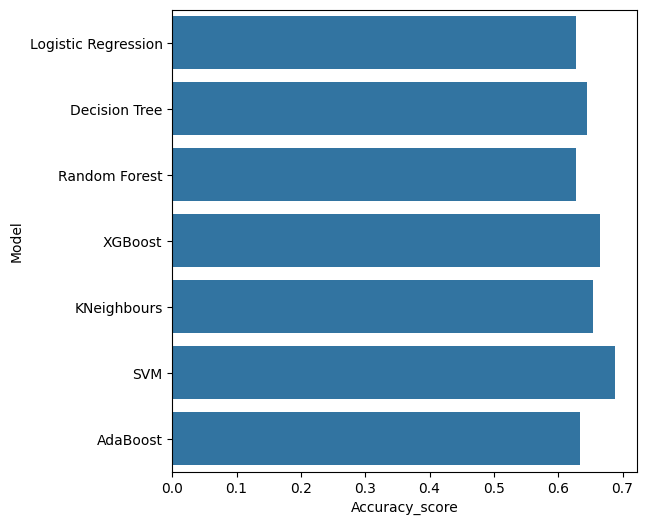

In [138]:
models = pd.DataFrame({
    'Model':['Logistic Regression', 'Decision Tree', 'Random Forest', 'XGBoost', 'KNeighbours', 'SVM', 'AdaBoost'],
    'Accuracy_score' :[lg, dt, rf, xgb, kn, sv, ada]
})
models
sns.barplot(x='Accuracy_score', y='Model', data=models)

models.sort_values(by='Accuracy_score', ascending=False)